<h2 style="text-align:center;font-size:200%;">
    <b>Deep Learning Model Training for gelose plate counting prediction</b>
</h2>
<h3  style="text-align:center;">Keywords : 
    <span style="border-radius:7px;background-color:yellowgreen;color:white;padding:7px;">Deep Learning</span>
    <span style="border-radius:7px;background-color:yellowgreen;color:white;padding:7px;">YOLOv5</span>
    <span style="border-radius:7px;background-color:yellowgreen;color:white;padding:7px;">Pytorch</span>
    <span style="border-radius:7px;background-color:yellowgreen;color:white;padding:7px;">Gelose plate</span>
    <span style="border-radius:7px;background-color:yellowgreen;color:white;padding:7px;">Microbiology</span>
</h3>


The purpose of this notebook is to train a Deep Learning model to identify bacterial colonies on a culture agar image. Once the colonies are detected, it is then possible to count them, saving valuable time thanks to this automation.

This work is based on the following scientific article, published in *Nature - Scientific Data*:

Annotated dataset for deep-learning-based bacterial colony detection
*Makrai, L., Fodróczy, B., Nagy, S.Á. et al. Annotated dataset for deep-learning-based bacterial colony detection. 
Sci Data 10, 497 (2023). https://doi.org/10.1038/s41597-023-02404-8*

# <div style="text-align: left; background-color: yellowgreen; color: white; padding: 10px; line-height:1;border-radius:10px">1. Import packages and dependancies</div>

In [50]:
# Generic libraries
import numpy as np
import pandas as pd
import os
import sys
import random
import shutil
import yaml
from pathlib import Path, PosixPath

# Image processing libraries
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
import seaborn as sns

# Pytorch & ML/DL libraries
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from sklearn.model_selection import train_test_split

In [51]:
# draw matplotlib figures in jupyter notebooks
%matplotlib inline

In [3]:
# Define the root directory
current_dir = Path.cwd()
data_dir = current_dir.parent / 'data'
models_dir = current_dir.parent / 'models'
notebooks_dir = current_dir.parent / 'notebooks'
assets_dir = current_dir.parent / 'assets'
yolo_dir = current_dir.parent / 'yolov5'

# <div style="text-align: left; background-color: yellowgreen; color: white; padding: 10px; line-height:1;border-radius:10px">2. Data preparation</div>

### 2.1. Data loading

The dataset can be found at the following address Annotated dataset for deep-learning-based bacterial colony detection and was downloaded in its version 3.

The dataset used for training the model consists of 369 images of Petri dishes, some with bacterial colonies and some without. Alongside these raw images, a data table contains the locations of the colonies identified on the various images. This location, in the form of a rectangle, is defined using the parameters bbox_x, bbox_y, bbox_width, and bbox_height, which correspond to the x and y coordinates, as well as the width and height of the boxes, respectively. By cross-referencing the two pieces of information—the raw image and the annotated coordinates—it is possible to reconstruct the complete image. The images are saved in PNG format and have a size of 3001x2960 pixels.

In [4]:
# Load annotation ".csv" file
df = pd.read_csv(str(data_dir / 'annot_tab.csv'))
df.head()

,label_name,bbox_x,bbox_y,bbox_width,bbox_height,image_name,image_width,image_height
0,sp01,1316,1600,145,115,sp01_img01.jpg,3001,2960
1,sp01,2601,1970,150,116,sp01_img01.jpg,3001,2960
2,sp01,2032,908,131,145,sp01_img01.jpg,3001,2960
3,sp01,1133,532,150,156,sp01_img01.jpg,3001,2960
4,sp01,1112,501,145,120,sp01_img02.jpg,2894,2890


In [5]:
# Load bacteria & media metadata
df_bacteria = pd.read_csv(str(data_dir / 'bacteria_data.csv'), sep=';')
df_bacteria.columns = ['Bacteria species', 'image_name_short', 'Gram', 'Culturing', 'Agar', 'Required_NAD', 'Required_CO2']
df_bacteria.head()

,Bacteria species,image_name_short,Gram,Culturing,Agar,Required_NAD,Required_CO2
0,Actinobacillus equuli,sp01,-,aerobic,blood,-,+
1,Actinobacillus pleuropneumoniae,sp02,-,aerobic,chocolate,-,+
2,Aeromonas hydrophila,sp03,-,aerobic,blood,-,-
3,Bacillus cereus,sp04,+,aerobic,blood,-,-
4,Bibersteinia trehalosi,sp05,-,aerobic,blood,-,-


In [6]:
# Regroup the number of colonies per image and save it to a new ".csv" file
counting_results = df.groupby("image_name").size().reset_index(name='colonies_count')
counting_results.to_csv(str(data_dir / "counting_results.csv"), index=False)
counting_results.head() 

,image_name,colonies_count
0,sp01_img01.jpg,4
1,sp01_img02.jpg,4
2,sp01_img03.jpg,5
3,sp01_img04.jpg,5
4,sp01_img05.jpg,10


### 2.2. Data prepraration & split

Performing a train-test split is essential in deep learning to evaluate a model's performance on unseen data and ensure it generalizes well beyond the training set. This process helps prevent overfitting by detecting discrepancies between the model's accuracy on the training and test datasets. Initially, all images in the downloaded dataset are located in a single folder. We will randomly separate them into a training set and a validation set to assess our model's performance.

In [7]:
random.seed(21)
train_test_ratio = 0.2
images_list = df['image_name'].unique().tolist()

# Randomized Manual train / test split for picture
num_elements_to_move = int(len(images_list) * train_test_ratio)
elements_to_move = random.sample(images_list, num_elements_to_move)
images_list_test = elements_to_move
images_list_train = [element for element in images_list if element not in elements_to_move]

# Randomized Manual train / test split for annotations and dataframes
train_df = df[df['image_name'].isin(images_list_train)]
val_df = df[df['image_name'].isin(images_list_test)]

In [8]:
# Verification of the split
print('Number of UFCs in the train set: {}'.format(train_df.shape[0]))
print('Number of UFCs in the test set: {}'.format(val_df.shape[0]))

Number of UFCs in the train set: 47106
Number of UFCs in the test set: 9759


Then we can create the folders organisation corresponding to the previous split:

In [9]:
# Folder paths creation
base_path = '../data'
train_image_dir = os.path.join(base_path, 'images/train')
val_image_dir = os.path.join(base_path, 'images/val')
train_label_dir = os.path.join(base_path, 'labels/train')
val_label_dir = os.path.join(base_path, 'labels/val')
os.makedirs(train_image_dir, exist_ok=True)
os.makedirs(val_image_dir, exist_ok=True)
os.makedirs(train_label_dir, exist_ok=True)
os.makedirs(val_label_dir, exist_ok=True)
train_image_dir = "../data/images/train"
val_image_dir = "../data/images/val"

Then, we will move the images and annotations to the corresponding folders using the 2 following functions:

In [10]:
def convert_bbox_format(row, image_width, image_height):
    """
    Convert bounding box annotations to YOLO format.

    YOLO format expects bounding boxes in the format:
    class_id, x_center, y_center, width, height
    where:
    - x_center and y_center are the normalized coordinates of the center of the bounding box.
    - width and height are normalized to the dimensions of the image.

    Parameters:
    row (dict): A dictionary containing bounding box details with keys 'bbox_x', 'bbox_y', 
                'bbox_width', and 'bbox_height'.
    image_width (int): The width of the image.
    image_height (int): The height of the image.

    Returns:
    list: A list containing class_id (0 for this example), x_center, y_center, width, and height 
          in YOLO format.
    """
    # Calculate the normalized center coordinates of the bounding box
    x_center = (row['bbox_x'] + row['bbox_width'] / 2) / image_width
    y_center = (row['bbox_y'] + row['bbox_height'] / 2) / image_height
    
    # Calculate the normalized width and height of the bounding box
    bbox_width = row['bbox_width'] / image_width
    bbox_height = row['bbox_height'] / image_height
    
    # Return the bounding box in YOLO format
    return [0, x_center, y_center, bbox_width, bbox_height]

In [11]:
def save_annotations_and_images(df, image_dir, label_dir, base_path):
    """
    Save image annotations in YOLO format and copy corresponding images to a specified directory.

    This function iterates over a DataFrame containing image names and bounding box annotations, 
    converting the bounding boxes to YOLO format and saving them as .txt files. It also copies 
    the images to a specified directory.

    Parameters:
    df (DataFrame): Pandas DataFrame containing the following columns:
                    - 'image_name': Name of the image file.
                    - 'bbox_x', 'bbox_y', 'bbox_width', 'bbox_height': Bounding box coordinates.
                    - 'image_width', 'image_height': Dimensions of the image.
    image_dir (str): Path to the directory where images will be copied.
    label_dir (str): Path to the directory where label files will be saved.
    base_path (str): Base directory path where original images are located.

    Returns:
    None
    """
    # Iterate over unique image names in the DataFrame
    for image_name in df['image_name'].unique():
        # Define paths for the source image and the destination image copy
        image_path = os.path.join(base_path, 'images_CFU', image_name)
        subset_image_path = os.path.join(image_dir, image_name)
        
        # Copy the image to the target directory
        shutil.copy(image_path, subset_image_path)
        
        # Filter the DataFrame to get annotations for the current image
        annotations = df[df['image_name'] == image_name]
        
        # Define the path for the label file
        label_path = os.path.join(label_dir, image_name.replace('.jpg', '.txt'))
        
        # Write the YOLO format annotations to the label file
        with open(label_path, 'w') as f:
            for idx, row in annotations.iterrows():
                # Convert the bounding box format to YOLO format
                bbox = convert_bbox_format(row, row['image_width'], row['image_height'])
                
                # Write the converted bounding box to the file
                f.write(' '.join(map(str, bbox)) + '\n')


In [12]:
%%time
# Save the annotations and images for the train set
save_annotations_and_images(train_df, train_image_dir, train_label_dir, '../data/')

CPU times: total: 391 ms
Wall time: 2.52 s


In [13]:
%%time
# Save the annotations and images for the test/validation set
save_annotations_and_images(val_df, val_image_dir, val_label_dir, '../data/')

CPU times: total: 78.1 ms
Wall time: 456 ms


# <div style="text-align: left; background-color: yellowgreen; color: white; padding: 10px; line-height:1;border-radius:10px">3. Data Visualization</div>

### 3.1 First visualisation of sample images and annotations

In [14]:
df_coord = df[['image_name', 'bbox_x', 'bbox_y', 'bbox_width', 'bbox_height']]

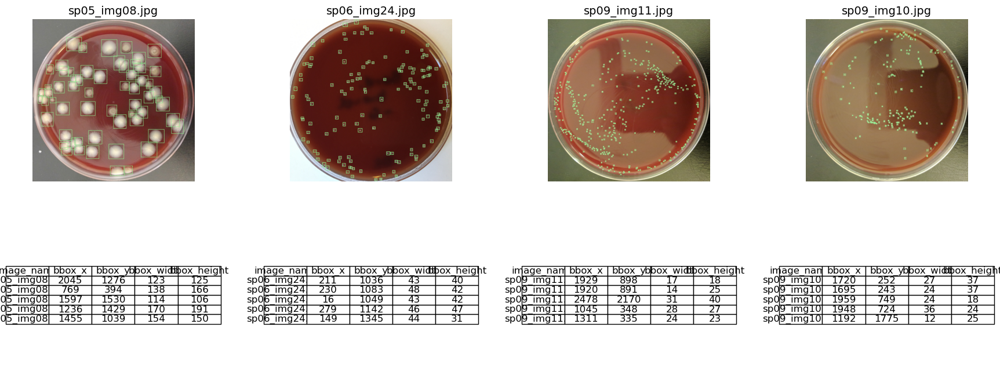

In [15]:
# Select randomly 4 pictures in the dataset with the associated annotated colonies
size = 4
max_rows = 5

fig, axes = plt.subplots(2, 4, figsize=(22, 8))

# Main loop to manage subplots
for i in range(size):
    # Load random image
    image_to_display = random.choice(list(df['image_name'].unique()))
    filtered_df = df_coord[df_coord['image_name'] == image_to_display]
    # image = cv2.imread(f'../data/images_CFU/{image_to_display}')
    # image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    image = Image.open(f'../data/images_CFU/{image_to_display}')
    draw = ImageDraw.Draw(image)
    for idx, row in filtered_df.iterrows():
        bbox = [row['bbox_x'], row['bbox_y'], row['bbox_x'] + row['bbox_width'], row['bbox_y'] + row['bbox_height']]
        draw.rectangle(bbox, outline='lightgreen', width=6)

    filtered_df = filtered_df.head(max_rows)
    # Load tabular data
    table = axes[1, i].table(cellText=filtered_df.values,
                            colLabels=filtered_df.columns,
                            cellLoc='center',
                            loc='center')
    # table.scale(1, 2)  # Ajuster la taille de la table

    # Manage axis and title
    axes[0, i].imshow(image)
    axes[0, i].set_title(image_to_display, fontsize=14)
    axes[0, i].axis('off')
    axes[1, i].axis('off')

    table.auto_set_font_size(False)
    table.set_fontsize(12)

### 3.2. Exploratory Data Analysis (EDA) 

The quality of a predictive model largely depends on the quality of the data it is based on. Therefore, before diving into a modeling exercise, it is important to know and understand the actual data. We will do this with very simple charts that will allow us to visualize the distribution of the data. This helps to better understand how to optimize the model and to anticipate the potential limitations that may arise with the trained model.

In [16]:
df['image_name_short'] = df['image_name'].apply(lambda x: x.split('_')[0])
df = df.merge(df_bacteria, on='image_name_short', how='left')

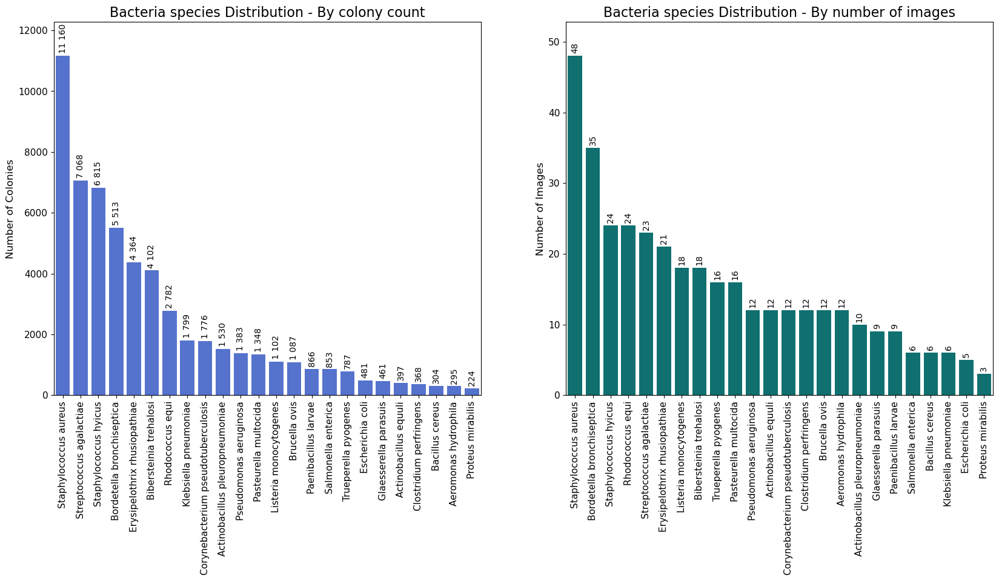

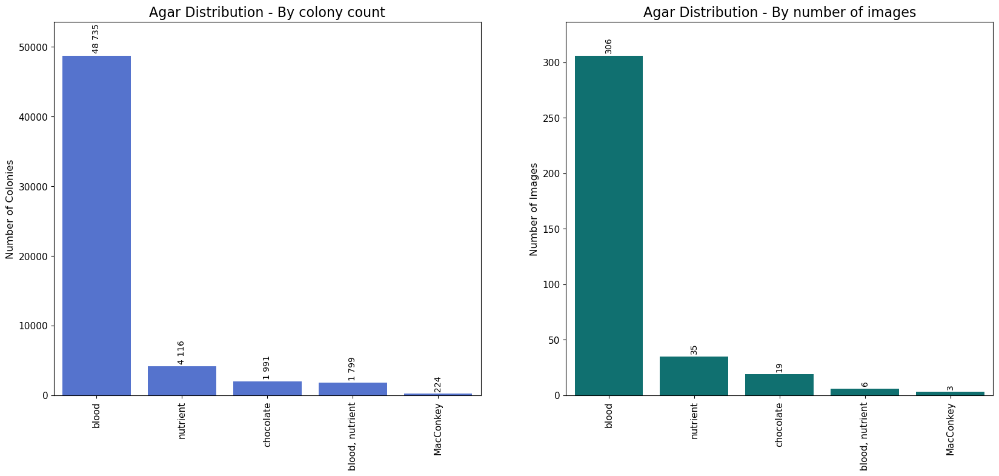

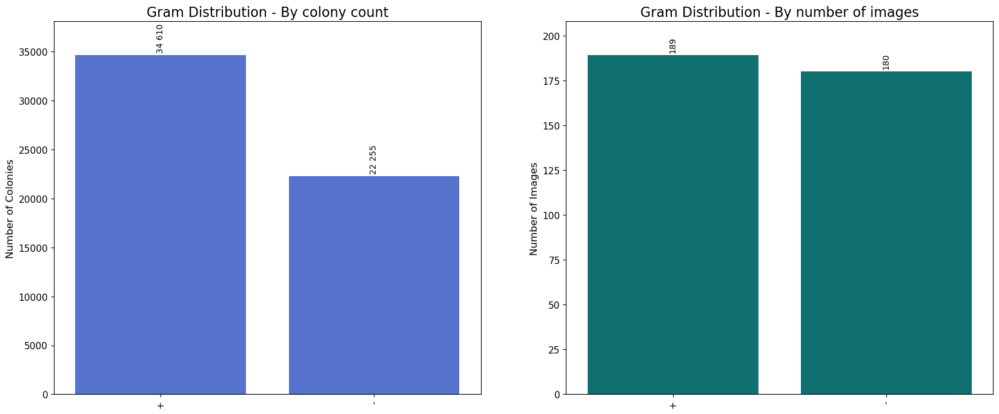

In [18]:
parameters_to_plot = ['Bacteria species', 'Agar', 'Gram']

for i in parameters_to_plot:
    # Set up the subplots
    fig, axes = plt.subplots(1, 2, figsize=(20, 8))

    # Plot 1: Number of colonies per bacteria species
    sns.countplot(ax=axes[0], x=i, data=df, order=df[i].value_counts().index, color='royalblue')

    # Axes settings for the first plot
    axes[0].set_title(i + ' Distribution - By colony count', fontsize=16)
    axes[0].set_ylabel('Number of Colonies', fontsize=12)
    axes[0].set_xlabel('')
    axes[0].tick_params(axis='x', rotation=90, labelsize=11)
    axes[0].tick_params(axis='y', labelsize=11)
    max_value = max([p.get_height() for p in axes[0].patches])
    axes[0].set_ylim(0, max_value * 1.1)

    # Add value labels on top of bars for the first plot
    for p in axes[0].patches:
        formatted_value = f'{p.get_height():,.0f}'.replace(',', ' ')
        axes[0].annotate(formatted_value, (p.get_x() + p.get_width() / 2., p.get_height()),
                     ha='center', va='baseline', fontsize=10, color='black', rotation=90, xytext=(0, 5),
                     textcoords='offset points')
        
    # Plot 2: Number of images per bacteria species
    image_counts = df.groupby(i)['image_name'].nunique().reset_index()
    sns.barplot(ax=axes[1], x=i, y='image_name', data=image_counts, 
                order=image_counts.sort_values('image_name', ascending=False)[i], color='teal')
    
    # Axes settings for the second plot
    axes[1].set_title(i + ' Distribution - By number of images', fontsize=16)
    axes[1].set_xlabel('')
    axes[1].set_ylabel('Number of Images', fontsize=12)
    axes[1].tick_params(axis='x', rotation=90, labelsize=11)
    axes[1].tick_params(axis='y', labelsize=11)
    max_value = max([p.get_height() for p in axes[1].patches])
    axes[1].set_ylim(0, max_value * 1.1)

    # Add value labels on top of bars for the second plot
    for p in axes[1].patches:
        axes[1].annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()),
                        ha='center', va='baseline', fontsize=10, color='black', rotation=90, xytext=(0, 5),
                        textcoords='offset points')

    # Adjust layout for better spacing between plots
    # plt.tight_layout()
    plt.show()


A couple of comments:
- We observe a clear overrepresentation of agar plates using blood culture media. It is highly likely that this does not accurately represent the actual production data of typical pharmaceutical companies. Therefore, we need to be cautious about this point. It is very possible that after training, the imbalance in our dataset will result in a better capability to detect colonies on blood agar compared to other media. Given the scope of this work, we have no choice but to proceed with this in mind. One solution could be to label additional photographs from other classes.
- We have a fairly large number of bacteria, with significant disparities in the amount of data available for each class. As a result, we won't be able to make predictions about the nature of the analyzed bacteria based on this dataset.

# <div style="text-align: left; background-color: yellowgreen; color: white; padding: 10px; line-height:1;border-radius:10px">4. Yolov5 Model Training</div>

YOLOv5 is a real-time object detection model known for its speed, efficiency, and ease of use. Developed by Ultralytics, it improves both speed and accuracy over its predecessors while being lighter and supporting PyTorch for easy training and deployment. YOLOv5 is modular, offering different model sizes to fit various performance needs and includes built-in support for data augmentation and image transformations, simplifying the training process.

YOLOv5 documentation : https://docs.ultralytics.com/fr/yolov5/

### 4.1 Configuration file

In [19]:
# Create a  YOLOv5 config file to set-up the model
data_config = {
    'train': train_image_dir,       # training pictures path
    'val': val_image_dir,           # validation picture path
    'nc': 1,                        # Number of classes - Only 1 because we just want to count colonies
    'names': ['colony']             # Name of classes
}

# Save the data configuration to a YAML file
file_path = data_dir / 'yolo_data.yaml'
with open(str(file_path), 'w') as file:
    yaml.dump(data_config, file)

### 4.2 Training step

Training a YOLOv5 model involves several key steps and parameters that need careful tuning to achieve optimal performance. YOLOv5, a state-of-the-art object detection model, is trained on a dataset of labeled images, where each object is identified with a bounding box and a corresponding class label.

During training, the model learns iteratively to predict bounding boxes and classes by minimizing the error between its predictions and the ground truth labels. This process is driven by three critical parameters: batch size, epochs, and learning rate.

- Batch Size: This defines the number of images processed in one forward and backward pass through the network. A larger batch size stabilizes the learning process and can lead to faster convergence but requires more memory. A smaller batch size is more memory-efficient and allows for more frequent weight updates but may make training less stable.

- Epochs: An epoch represents one complete cycle through the entire training dataset. The number of epochs determines how many times the model will see each image during training. More epochs allow for deeper learning, but too many can result in overfitting, where the model excels on training data but struggles with new, unseen data.

- Learning Rate: The learning rate controls how much the model's weights are adjusted in response to the error during each update. A high learning rate speeds up training but can cause the model to overshoot optimal solutions, while a low learning rate ensures steady progress but may slow down convergence.

Throughout training, the model's performance is tracked using metrics such as precision, recall, and mAP (mean Average Precision) to ensure effective learning. Afterward, the best-performing model on the validation set is selected for deployment in object detection tasks.

To optimize the model, I experimented with different batch sizes and epoch values by analyzing the learning curves. Further optimization, such as tuning the learning rate, would enhance the training process.

In [24]:
base_dir = Path.cwd()
data_path = base_dir.parent / "data/yolo_data.yaml"
project_path = base_dir.parent / "models"
hyp_path = base_dir.parent / "data/hyps/hyp.scratch.yaml"
train_script = base_dir.parent / "yolov5" / "train.py"

In [25]:
command = f"python {train_script} --img 640 --batch 24 --epochs 50 --data {data_path} --weights yolov5s.pt --project {project_path} --name yolov5_training_adjusted --hyp {hyp_path} --optimizer Adam"

In [26]:
!{command}

github: skipping check (not a git repository), for updates see https://github.com/ultralytics/yolov5


train: weights=yolov5s.pt, cfg=, data=C:\Users\Arnaud\UFC-counter\data\yolo_data.yaml, hyp=C:\Users\Arnaud\UFC-counter\data\hyps\hyp.scratch.yaml, epochs=50, batch_size=24, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=..\yolov5\data\hyps, resume_evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=Adam, sync_bn=False, workers=8, project=C:\Users\Arnaud\UFC-counter\models, name=yolov5_training_adjusted, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest, ndjson_console=False, ndjson_file=False
YOLOv5  2024-8-18 Python-3.11.5 torch-2.3.1+cpu CPU

hyperparameters: lr0=0.001, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, 

Here are the results of the training process. 

The precision metric is 92%.

**Confusion matrix**
<img src="../assets/confusion_matrix.png" alt="drawing" width="500"/>
The confusion matrix highlights the model's strong performance in correctly predicting "colony" instances with 81% accuracy but shows some false positives, where 19% of background instances were misclassified as colonies.

**PR curve**
<img src="../assets/PR_curve.png" alt="drawing" width="500"/>
The precision-recall curve shows a strong performance of the model with an average precision (mAP) of 0.822, indicating high accuracy in detecting bacterial colonies across various recall levels.

**learning curves**
<img src="../assets/results.png" alt="drawing" width="500"/>
The graphs show a steady decrease in training and validation losses (box and object loss), while metrics such as precision, recall, and mAP steadily improve, demonstrating the model’s convergence and learning over the 50 epochs.

# <div style="text-align: left; background-color: yellowgreen; color: white; padding: 10px; line-height:1;border-radius:10px">5. Inference Test</div>

We have now a trained yolov5 model. To test it, we can infere the model on new picture

### 5.1 Load a new picture

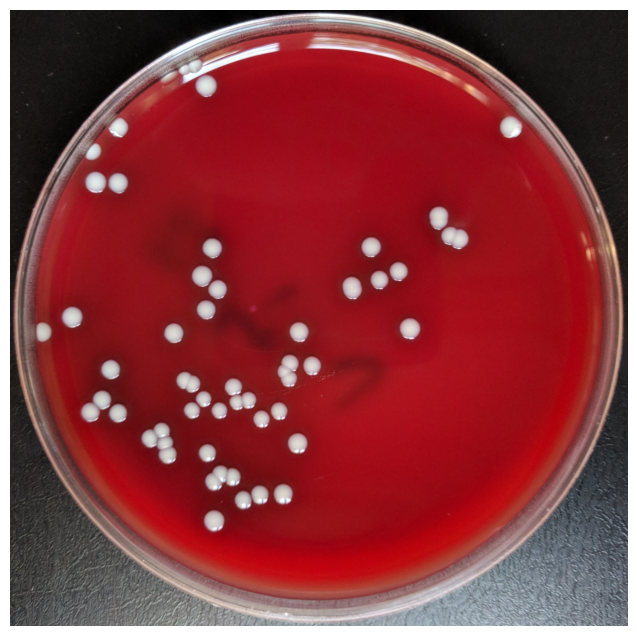

In [27]:
new_image_path = str(assets_dir / "sample" / "test.jpg")
image = Image.open(new_image_path)

plt.figure(figsize=(8, 8))
plt.imshow(image)
plt.axis('off')
plt.show()

### 5.2 Infere the model on the new picture

In [32]:
str(yolo_dir)

'C:\\Users\\Arnaud\\UFC-counter\\yolov5'

In [31]:
str(model_path)

'C:\\Users\\Arnaud\\UFC-counter\\models\\20240818_UFC_counting_model_v1.0.pt'

In [41]:
# Load the model
model_path = models_dir / "20240818_UFC_counting_model_v1.0.pt"
model = torch.hub.load('ultralytics/yolov5', 'custom', path=str(model_path))

Using cache found in C:\Users\Arnaud/.cache\torch\hub\ultralytics_yolov5_master
YOLOv5  2024-8-14 Python-3.11.5 torch-2.3.1+cpu CPU

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 


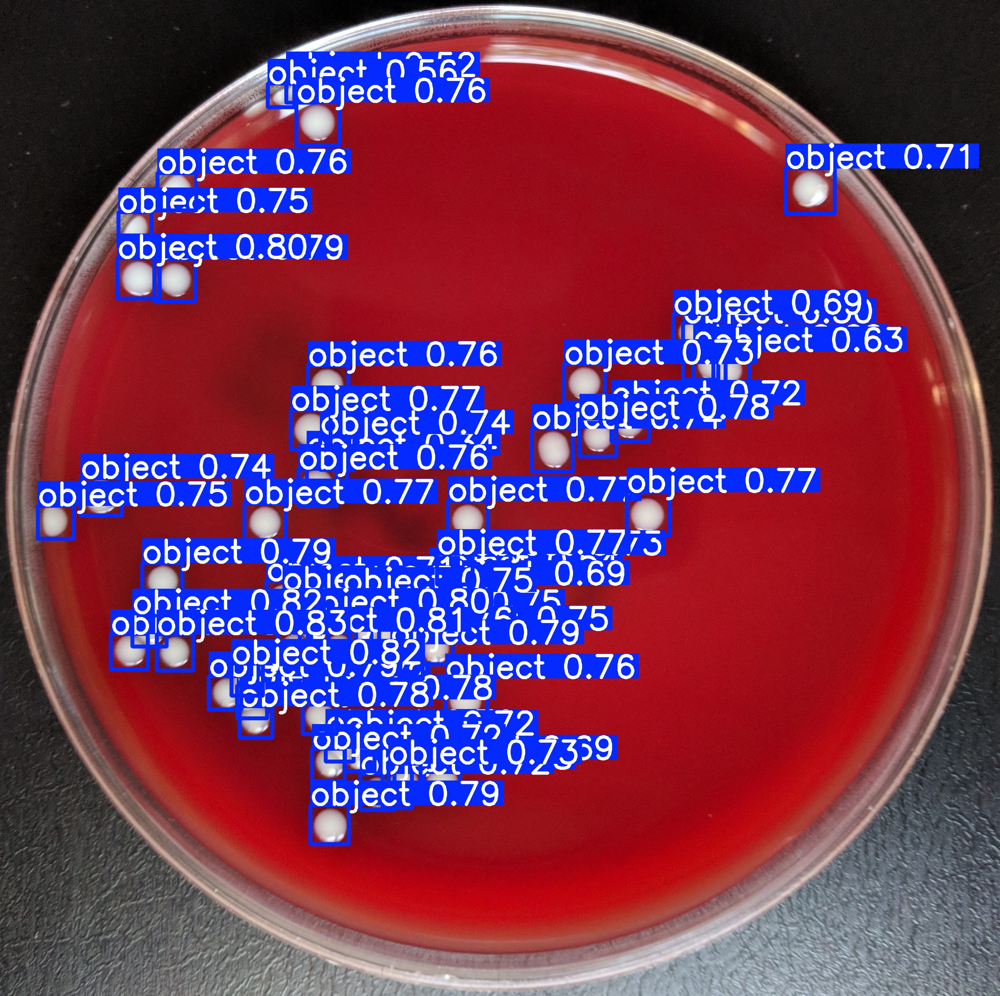

In [42]:
results = model(new_image_path)
results.show()

In [44]:
# Access to the coordinates of the predicted colonies
results_data = results.pandas().xyxy[0]

for i in ['xmin', 'ymin', 'xmax', 'ymax']:
    results_data[i] = results_data[i].astype(int)
    
print(results_data[:10])

   xmin  ymin  xmax  ymax  confidence  class    name
0   449  1819   553  1923    0.831166      0  object
1   663  1903   753  1995    0.819959      0  object
2   379  1759   477  1854    0.818863      0  object
3   796  1811   891  1905    0.810918      0  object
4   317  1818   423  1920    0.807132      0  object
5   336   740   457   856    0.804011      0  object
6   859  1757   941  1839    0.803973      0  object
7   598  1939   691  2035    0.794937      0  object
8   407  1614   522  1721    0.790763      0  object
9   889  2309   999  2421    0.789844      0  object


In [47]:
# Load the picture and add an ImageDraw object
image = Image.open(new_image_path)
draw = ImageDraw.Draw(image)
# Draw the rectangle for each coordinates
for idx, row in results_data.iterrows():
    bbox = [results_data.loc[idx, 'xmin'], results_data.loc[idx, 'ymin'], results_data.loc[idx, 'xmax'], results_data.loc[idx, 'ymax']]
    draw.rectangle(bbox, outline='lightgreen', width=6)

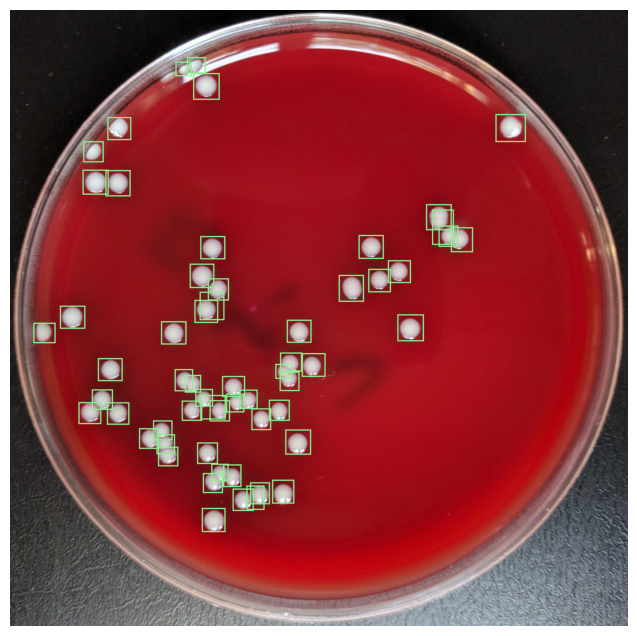

In [53]:
# Show the picture
plt.figure(figsize=(8, 8))
plt.imshow(image)
plt.axis('off')
plt.show()

In [49]:
print("Number of identified colonies : {} CFU".format(results_data.shape[0]))

Number of identified colonies : 59 CFU


# <div style="text-align: left; background-color: yellowgreen; color: white; padding: 10px; line-height:1;border-radius:10px">Conclusion</div>

This notebook was a sandbox for model training.
See the web app for a real application perspective.